In [1]:
%load_ext autoreload
%autoreload 2

import xarray as xr
import numpy as np
import pandas as pd

import glob
import sys
import os

import matplotlib.pyplot as plt 
from matplotlib.colors import LogNorm
from matplotlib.colors import Normalize

# from src_NO2_ICON_TROPOMI_comp import find_closest_full_hour_TROPOMI,ICON_to_TROPOMI, recalc_AMF, TROPOMI_to_ICON, plot_TROPOMI_map, calc_ICON_col, plot_ICON_map
from src_NO2_ICON_TROPOMI_comp import find_closest_full_hour_TROPOMI,ICON_to_TROPOMI, recalc_AMF, TROPOMI_to_ICON, plot_TROPOMI_map, calc_ICON_col, plot_ICON_map


In [2]:
# Define domain
min_lon, max_lon, min_lat, max_lat = -13, 28, 32, 68

overpass_nr = 0         #Since there can be multiple overpasses over europe, define the overpass number
date = '20190216'

# Files
TROPOMI_file = glob.glob(f"/scratch/snx3000/amols/data/S5P_raw/S5P_RPRO_L2__NO2____{date}*")[overpass_nr]
hour = find_closest_full_hour_TROPOMI(TROPOMI_file)
ICON_file = f'/scratch/snx3000/amols/data/nudged_ICON_data/icon-art-full-chem_EU_LBC_{date}T{hour}0000Z.nc'

# Define the output path
output_path = './column_comp_results/'

### Define subdirectories to save output
# Subdirectory names
subdirectories = ['reduced_ICON', 'ICON_on_TROPOMI', 'recalc_TROPOMI_AMF',
                  'TROPOMI_on_ICON', 'final_merged_result', 'figs']

# Create subdirectories if they don't exist
for subdirectory in subdirectories:
    os.makedirs(os.path.join(output_path, subdirectory), exist_ok=True)


In [3]:
### Compare the ICON and TROPOMI columns in 4 steps

def compare_ICON_TROPOMI(ICON_file, TROPOMI_file, output_path, date, overpass_nr, min_lon, max_lon, min_lat, max_lat):

    #### 1. Remap ICON to TROPOMI
    ICON_to_TROPOMI(ICON_file, TROPOMI_file, output_path, date, overpass_nr)

    #### 2. Recalculate AMF + TROPOMI NO2 columns
    recalc_AMF(TROPOMI_file, output_path, overpass_nr, date, min_lon, max_lon, min_lat, max_lat)

    #### 3. Remap TROPOMI to ICON grid
    TROPOMI_to_ICON(ICON_file, output_path, date, overpass_nr)

    #### 4. Calculate ICON NO2 columns
    calc_ICON_col(ICON_file, output_path, overpass_nr, date)

#### 1. Compute the NO2 columns for one date

In [6]:
# Perform calculation for one date

compare_ICON_TROPOMI(ICON_file, TROPOMI_file, output_path, date, overpass_nr, min_lon, max_lon, min_lat, max_lat)


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [40.26s 2240MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:164: FutureWarning: the `pandas.

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1279007292 values from 277 variables over 1 timestep [20.83s 7607MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (425x641) to unstructured (90268) grid, with source mask (144199)
cdo    remapcon: Processed 817275 values from 3 variables over 1 timestep [4.42s 166MB].


#### 2. Compute the NO2 columns for multiple dates

11


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [34.42s 2239MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [21.12s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (425x641) to unstructured (90268) grid, with source mask (101357)
cdo    remapcon: Processed 817275 values from 3 variables over 1 timestep [4.09s 166MB].


13


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460700) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [29.23s 2243MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460700, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3245 3245 3245 3245 3245 3245
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 351MB ...
    temp      (time, height, ncells) float32 351MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 351M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [20.59s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (375x584) to unstructured (90268) grid, with source mask (65206)
cdo    remapcon: Processed 657000 values from 3 variables over 1 timestep [3.28s 145MB].


TROPOMI file does not exist for date 20190304 and overpass number 2. Skipping...
11


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [30.51s 2238MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [20.70s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (407x656) to unstructured (90268) grid, with source mask (92448)
cdo    remapcon: Processed 800976 values from 3 variables over 1 timestep [3.89s 164MB].


13


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [27.39s 2242MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [21.84s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (422x584) to unstructured (90268) grid, with source mask (80135)
cdo    remapcon: Processed 739344 values from 3 variables over 1 timestep [3.25s 155MB].


TROPOMI file does not exist for date 20190305 and overpass number 2. Skipping...
11


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460700) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [28.47s 2237MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460700, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3245 3245 3245 3245 3245 3245
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 351MB ...
    temp      (time, height, ncells) float32 351MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 351M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [32.87s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (383x664) to unstructured (90268) grid, with source mask (77054)
cdo    remapcon: Processed 762936 values from 3 variables over 1 timestep [3.84s 158MB].


12


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [27.88s 2241MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [21.61s 7670MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (450x593) to unstructured (90268) grid, with source mask (68978)
cdo    remapcon: Processed 800550 values from 3 variables over 1 timestep [3.69s 164MB].


TROPOMI file does not exist for date 20190306 and overpass number 2. Skipping...
12


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460700) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [31.65s 2241MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460700, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3245 3245 3245 3245 3245 3245
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 351MB ...
    temp      (time, height, ncells) float32 351MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 351M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [21.37s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (450x605) to unstructured (90268) grid, with source mask (100987)
cdo    remapcon: Processed 816750 values from 3 variables over 1 timestep [3.96s 166MB].


10


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [27.55s 2237MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [20.86s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (351x666) to unstructured (90268) grid, with source mask (35451)
cdo    remapcon: Processed 701298 values from 3 variables over 1 timestep [3.21s 151MB].


TROPOMI file does not exist for date 20190307 and overpass number 2. Skipping...
12


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [28.95s 2240MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [33.24s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (450x619) to unstructured (90268) grid, with source mask (106597)
cdo    remapcon: Processed 835650 values from 3 variables over 1 timestep [4.30s 169MB].


TROPOMI file does not exist for date 20190308 and overpass number 1. Skipping...
TROPOMI file does not exist for date 20190308 and overpass number 2. Skipping...
11


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [29.16s 2239MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [21.66s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (430x635) to unstructured (90268) grid, with source mask (105244)
cdo    remapcon: Processed 819150 values from 3 variables over 1 timestep [4.14s 167MB].


TROPOMI file does not exist for date 20190309 and overpass number 1. Skipping...
TROPOMI file does not exist for date 20190309 and overpass number 2. Skipping...
13


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [35.38s 2242MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [20.64s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (409x584) to unstructured (90268) grid, with source mask (97155)
cdo    remapcon: Processed 716568 values from 3 variables over 1 timestep [3.18s 152MB].


11


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [29.37s 2238MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [22.72s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (413x651) to unstructured (90268) grid, with source mask (100500)
cdo    remapcon: Processed 806589 values from 3 variables over 1 timestep [5.16s 165MB].


TROPOMI file does not exist for date 20190310 and overpass number 2. Skipping...
11


Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
Warning (cdf_set_var): Inconsistent variable definition for clon_bnds!
Warning (cdf_set_var): Inconsistent variable definition for clat_bnds!
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_bnds
Warning (cdfScanVarAttr): NetCDF: Variable not found - height_3_bnds
Warning (find_time_vars): Time variable >time< not found!
cdo    remapcon: YAC first order conservative weights from unstructured (90268) to unstructured (1460250) grid
cdo    remapcon: Processed 43599444 values from 9 variables over 1 timestep [31.68s 2238MB].
/scratch/snx3000/amols/NO2_col_comp_nudged/src_NO2_ICON_TROPOMI_comp_AMF_corr.py:165: FutureWarning: the `pandas.MultiIndex` object(s) passed as 'ncells' coordinate(s) or data variable(s) will no longer be implicitly promote

<xarray.Dataset> Size: 3GB
Dimensions:   (time: 1, ncells: 1460250, vertices: 4, height: 60, height_3: 61,
               height_2: 61)
Coordinates:
  * time      (time) float64 8B 0.0
    lon       (ncells) float64 12MB ...
    lat       (ncells) float64 12MB ...
  * height    (height) float64 480B 1.0 2.0 3.0 4.0 5.0 ... 57.0 58.0 59.0 60.0
  * height_3  (height_3) float64 488B 1.0 2.0 3.0 4.0 ... 58.0 59.0 60.0 61.0
  * ncells    (ncells) object 12MB MultiIndex
  * nobs      (ncells) int64 12MB 0 0 0 0 0 0 ... 3244 3244 3244 3244 3244 3244
  * nrows     (ncells) int64 12MB 0 1 2 3 4 5 6 ... 443 444 445 446 447 448 449
Dimensions without coordinates: vertices, height_2
Data variables:
    lon_bnds  (ncells, vertices) float64 47MB ...
    lat_bnds  (ncells, vertices) float64 47MB ...
    pres      (time, height, ncells) float32 350MB ...
    temp      (time, height, ncells) float32 350MB ...
    z_ifc     (height_3, ncells) float32 356MB ...
    z_mc      (height, ncells) float32 350M

Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    selgrid: Processed 1289929720 values from 279 variables over 1 timestep [30.80s 7671MB].
Switching to atp/3.14.5.
Switching to cray-libsci/20.09.1.
Switching to cray-mpich/7.7.18.
Switching to craype/2.7.10.
Switching to gcc/9.3.0.
Switching to modules/3.2.11.4.
Switching to perftools-base/21.09.0.
Switching to pmi/5.0.17.
cdo    remapcon: YAC first order conservative weights from curvilinear (391x661) to unstructured (90268) grid, with source mask (72326)
cdo    remapcon: Processed 775353 values from 3 variables over 1 timestep [4.00s 161MB].


TROPOMI file does not exist for date 20190311 and overpass number 1. Skipping...
TROPOMI file does not exist for date 20190311 and overpass number 2. Skipping...


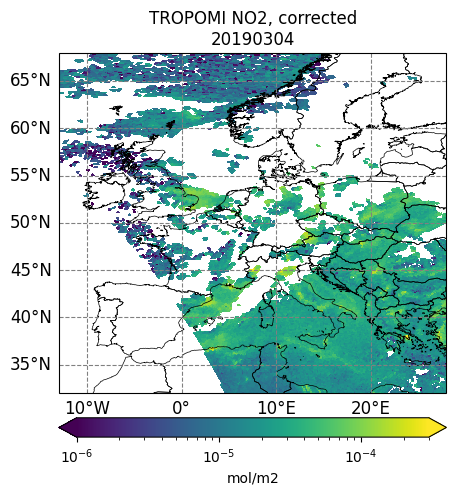

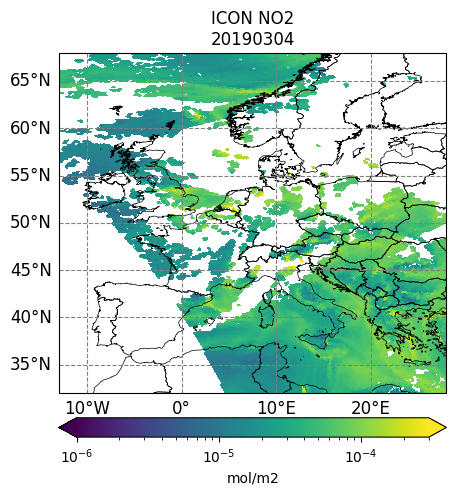

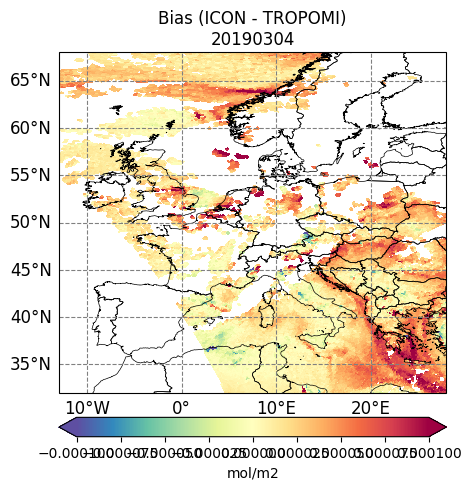

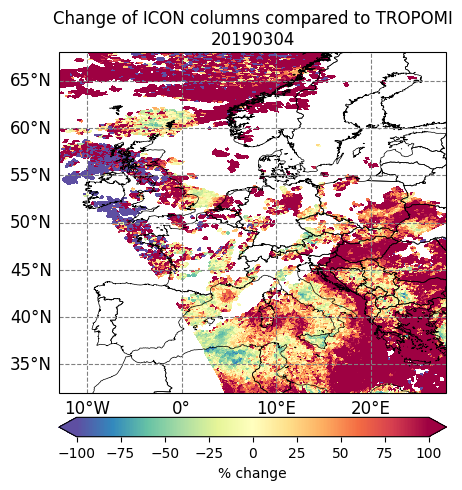

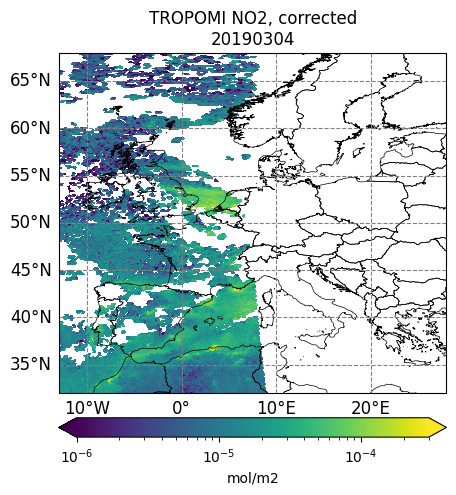

...

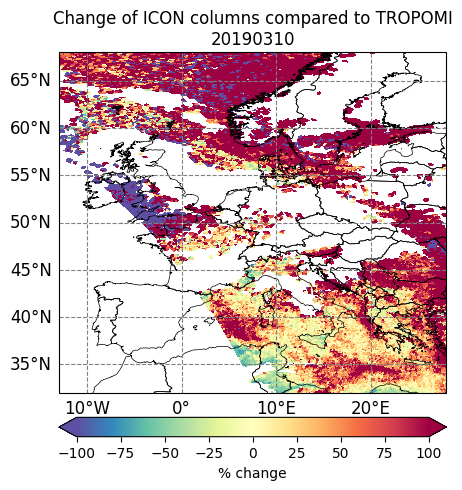

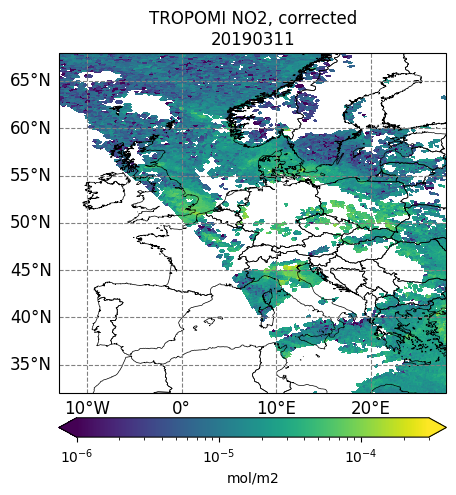

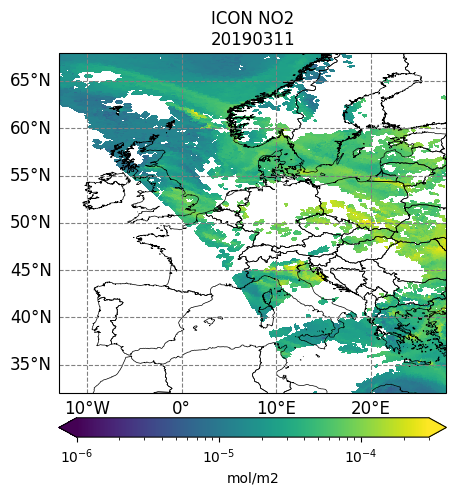

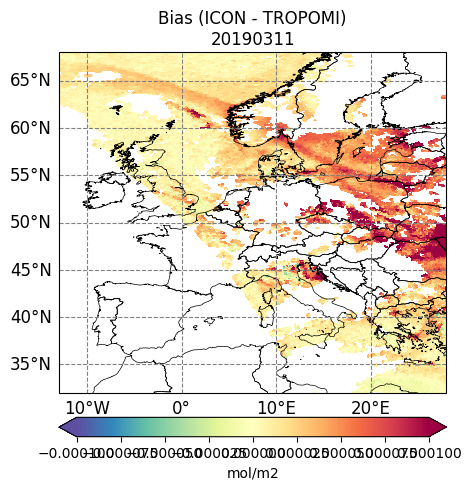

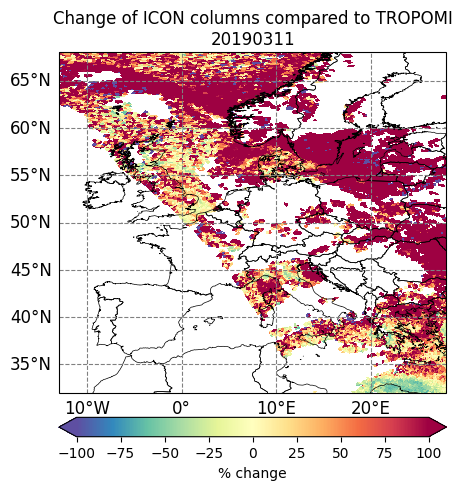

In [6]:
# Define domain
min_lon, max_lon, min_lat, max_lat = -13, 28, 32, 68

# dates_feb = np.arange(20190212, 20190228)
dates_mar = np.arange(20190304, 20190312)

# dates_jul = np.arange(20190812, 20190813)
# dates = np.concatenate((dates_feb, dates_mar))
overpass_nrs = np.arange(0,3)

# dates = np.arange(20190216, 20190217)
# overpass_nrs = np.arange(0,1)

for date in dates_mar:
    
    # Check if there are any TROPOMI files for the date
    TROPOMI_files = glob.glob(f"/scratch/snx3000/amols/data/S5P_raw/S5P_RPRO_L2__NO2____{date}*")
    if not TROPOMI_files:  # If the list is empty
        print(f"No TROPOMI files found for date {date}. Skipping...")
        continue

    for overpass_nr in overpass_nrs:
        # Since we know there's at least one TROPOMI file for this date, we check the specific overpass
        try:
            TROPOMI_file = TROPOMI_files[overpass_nr]
        except IndexError:
            # This overpass number does not exist for the date
            print(f"TROPOMI file does not exist for date {date} and overpass number {overpass_nr}. Skipping...")
            continue

        # Files
        hour = find_closest_full_hour_TROPOMI(TROPOMI_file)

        print(hour)

        ICON_file = f'/scratch/snx3000/amols/data/nudged_ICON_data/icon-art-full-chem_EU_LBC_{date}T{hour}0000Z.nc'
        
        compare_ICON_TROPOMI(ICON_file, TROPOMI_file, output_path, date, overpass_nr, min_lon, max_lon, min_lat, max_lat)

        # Plot
        combined_ds =  xr.open_dataset(f"{output_path}final_merged_result/column_comp_{date}_{overpass_nr}.nc")

        var = combined_ds.NO2_recalc.values
        plot_ICON_map(combined_ds, var, 1e-6, 3e-4, f'TROPOMI NO2, corrected\n{date}', 'mol/m2', scale=LogNorm, colormap='viridis', save=True, save_as = 'TROPOMI_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

        var = combined_ds.NO2_ICON[:,0].values
        plot_ICON_map(combined_ds, var, 1e-6, 3e-4, f'ICON NO2\n{date}', 'mol/m2', scale=LogNorm, colormap='viridis', save=True, save_as = 'ICON_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

        var = combined_ds.NO2_ICON[:,0].values-combined_ds.NO2_recalc.values
        plot_ICON_map(combined_ds, var, -1e-4, 1e-4, f'Bias (ICON - TROPOMI)\n{date}', 'mol/m2', scale=Normalize, colormap='Spectral_r', save=True, save_as = 'bias_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

        var = (combined_ds.NO2_ICON[:,0].values-(combined_ds.NO2_recalc.values))/combined_ds.NO2_recalc.values*100
        plot_ICON_map(combined_ds, var, -100, 100, f'Change of ICON columns compared to TROPOMI\n{date}', '% change', scale=Normalize, colormap='Spectral_r', save=True, save_as = 'change_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)


#### 3. Plot results


In [6]:
# Open data to plot

overpass_nr = 0
date = 20190216

data_S5p_recalc_AMF = xr.open_dataset(f"{output_path}recalc_TROPOMI_AMF/recalc_AMF_{date}_{overpass_nr}.nc")
combined_ds =  xr.open_dataset(f"{output_path}final_merged_result/column_comp_{date}_{overpass_nr}.nc")


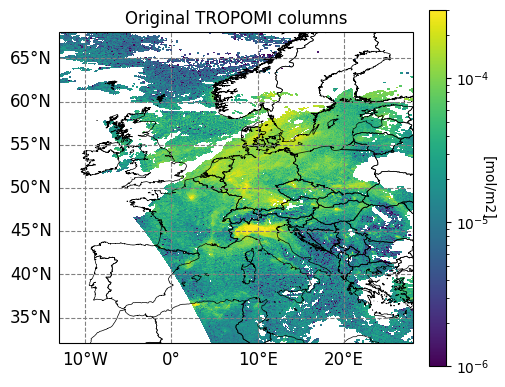

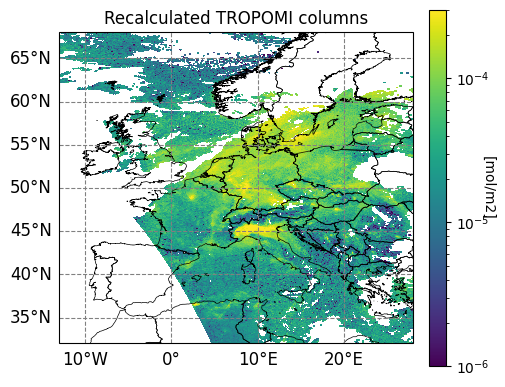

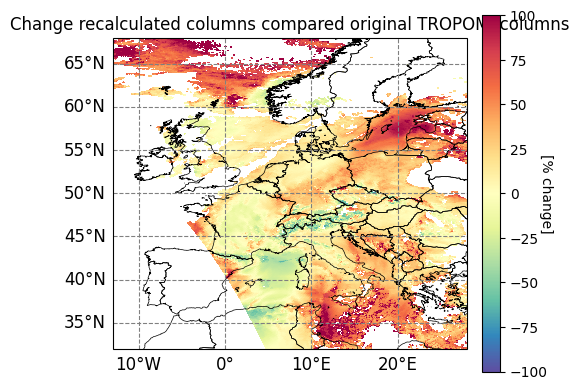

In [11]:
var_TROPOMI = data_S5p_recalc_AMF.nitrogendioxide_tropospheric_column[0,:,:].values
plot_TROPOMI_map(data_S5p_recalc_AMF, var_TROPOMI, 1e-6, 3e-4, 'Original TROPOMI columns', '[mol/m2]', LogNorm(), )

var = data_S5p_recalc_AMF['NO2_recalc_ICON'][0,:,:].values
plot_TROPOMI_map(data_S5p_recalc_AMF,var, 1e-6, 3e-4, 'Recalculated TROPOMI columns', '[mol/m2]', LogNorm())

var = (data_S5p_recalc_AMF['NO2_recalc_ICON'][0,:,:].values - data_S5p_recalc_AMF['nitrogendioxide_tropospheric_column'][0,:,:].values) / data_S5p_recalc_AMF['nitrogendioxide_tropospheric_column'][0,:,:].values *100
plot_TROPOMI_map(data_S5p_recalc_AMF,var, -100, 100, 'Change recalculated columns compared original TROPOMI columns', '[% change]', None, colormap='Spectral_r')

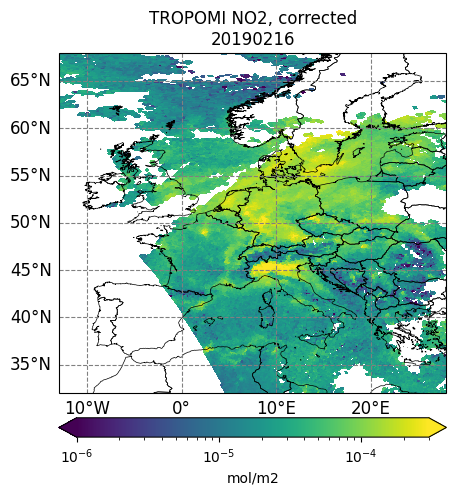

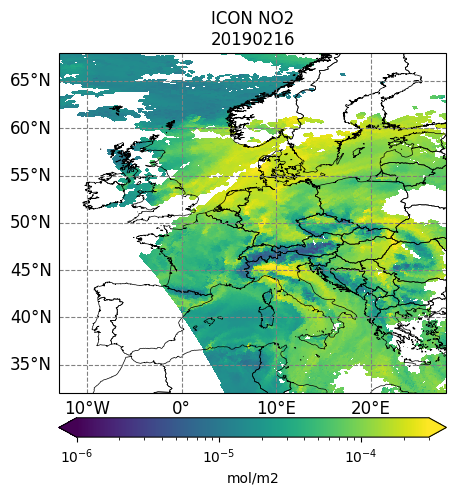

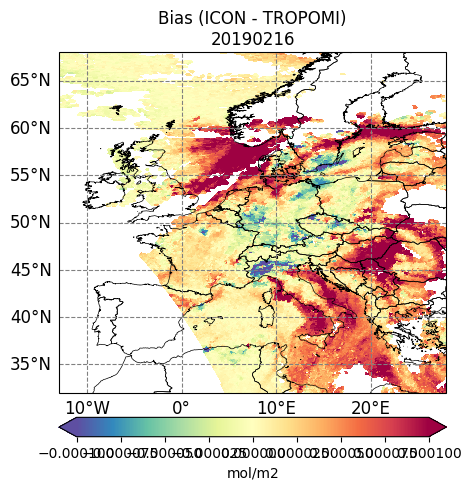

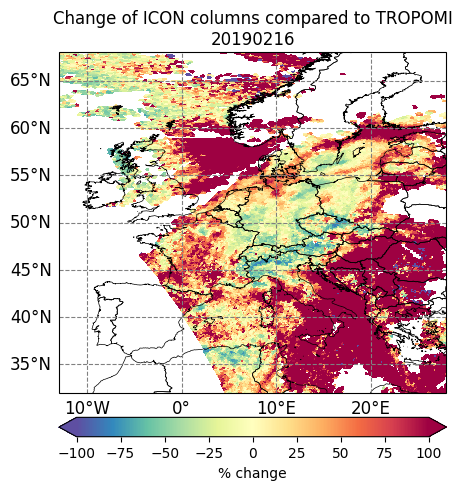

In [12]:
var = combined_ds.NO2_recalc.values
plot_ICON_map(combined_ds, var, 1e-6, 3e-4, f'TROPOMI NO2, corrected\n{date}', 'mol/m2', scale=LogNorm, colormap='viridis', save=True, save_as = 'TROPOMI_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

var = combined_ds.NO2_ICON[:,0].values
plot_ICON_map(combined_ds, var, 1e-6, 3e-4, f'ICON NO2\n{date}', 'mol/m2', scale=LogNorm, colormap='viridis', save=True, save_as = 'ICON_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

var = combined_ds.NO2_ICON[:,0].values-combined_ds.NO2_recalc.values
plot_ICON_map(combined_ds, var, -1e-4, 1e-4, f'Bias (ICON - TROPOMI)\n{date}', 'mol/m2', scale=Normalize, colormap='Spectral_r', save=True, save_as = 'bias_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)

var = (combined_ds.NO2_ICON[:,0].values-(combined_ds.NO2_recalc.values))/combined_ds.NO2_recalc.values*100
plot_ICON_map(combined_ds, var, -100, 100, f'Change of ICON columns compared to TROPOMI\n{date}', '% change', scale=Normalize, colormap='Spectral_r', save=True, save_as = 'change_fig', output_path = output_path, date=date, overpass_nr=overpass_nr)